# GATHERING DATA

The project is to analyse the @WeRateDogs data from its Twitter Account up to the period of August, 2017. Data for these analyses are sourced programmatically using python's libraries and gotten from three sources: the first is the twitter-archive-enhanced dataset already supplied by Udacity, the second will be scraped from a web url and the third using Twitter's API.

In [1]:
#Importing the required python libraries to programmatically gather the data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from timeit import default_timer as timer
import json

In [2]:
#First dataset from Udacity
twitter = pd.read_csv("downloads/twitter-archive-enhanced.csv")
twitter

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


In [3]:
#Second dataset scraping from a web url
import requests
url = "https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv"
response = requests.get(url)
with open("image-predictions.tsv",mode="wb")as file:
    file.write(response.content)
twit_predictions = pd.read_csv("image-predictions.tsv", sep="\t")
twit_predictions

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [4]:
#Installing tweepy to account
!pip install tweepy

#Querying Twitter API to access the third data
import tweepy
consumer_key = "xxxxxxxxxxxxxxxxxxxxxxxxxxxx"
consumer_secret = "xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx"
access_token = "xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx"
access_secret = "xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx"

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
api = tweepy.API(auth, wait_on_rate_limit = True)

In [6]:
tweet_ids=list(twitter.tweet_id)
tweet = api.get_status(tweet_ids[0], tweet_mode='extended')
print(tweet)

Status(_api=<tweepy.api.API object at 0x0000021D7E28FA90>, _json={'created_at': 'Tue Aug 01 16:23:56 +0000 2017', 'id': 892420643555336193, 'id_str': '892420643555336193', 'full_text': "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'large': {'w': 

In [7]:
tweet_ids = list(twitter.tweet_id)
len(tweet_ids)
# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
check_again_dict = {}
start = timer()
#save each tweets returned json as a new line in a .txt file
with open("tweet_json.txt", "w") as outfile:
    for tweet_id in tweet_ids:
        count+=1
        print(str(count)+":"+str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print (tweet._json)
            json.dump(tweet._json,outfile)
            outfile.write('\n')
        except tweepy.errors.TweepyException as e:
            print("check_again")
            check_again_dict[tweet_id] = e
            pass
end = timer()
print(end-start)
print(check_again_dict)

1:892420643555336193
{'created_at': 'Tue Aug 01 16:23:56 +0000 2017', 'id': 892420643555336193, 'id_str': '892420643555336193', 'full_text': "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'large': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}, 'extend

Rate limit reached. Sleeping for: 131


{'created_at': 'Fri Jul 29 00:57:05 +0000 2016', 'id': 758828659922702336, 'id_str': '758828659922702336', 'full_text': 'This doggo is just waiting for someone to be proud of her and her accomplishment. 13/10 legendary af https://t.co/9T2h14yn4Q', 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 758828647570558976, 'id_str': '758828647570558976', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/Cofmom_VUAA4dRO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cofmom_VUAA4dRO.jpg', 'url': 'https://t.co/9T2h14yn4Q', 'display_url': 'pic.twitter.com/9T2h14yn4Q', 'expanded_url': 'https://twitter.com/dog_rates/status/758828659922702336/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 564, 'h': 560, 'resize': 'fit'}, 'medium': {'w': 564, 'h': 560, 'resize': 'fit'}, 'large': {'w': 564, 'h': 560, 'resize': 'fit'}}}]}, 'extended_e

Rate limit reached. Sleeping for: 194


{'created_at': 'Wed Dec 16 18:03:28 +0000 2015', 'id': 677187300187611136, 'id_str': '677187300187611136', 'full_text': 'Here we see a Byzantine Rigatoni. Very aerodynamic. No eyes. Actually not windy here they just look like that. 9/10 https://t.co/gzI0m6wXRo', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677187290628780032, 'id_str': '677187290628780032', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CWXaQMBWcAAATDi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWXaQMBWcAAATDi.jpg', 'url': 'https://t.co/gzI0m6wXRo', 'display_url': 'pic.twitter.com/gzI0m6wXRo', 'expanded_url': 'https://twitter.com/dog_rates/status/677187300187611136/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 640, 'h': 353, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 353, 'resize': 'fit'}, 'small': {'w': 640, 'h': 353, 'resize': 'fit'}}}

In [8]:
tweets_list = []
with open ('tweet_json.txt', 'r') as file:
    for line in file:
        twits = json.loads(line)
        tweets_list.append(twits)

In [13]:
twits = pd.DataFrame(tweets_list, columns=["id","retweet_count","favorite_count"])
twits

,id,retweet_count,favorite_count
0,892420643555336193,7009,33810
1,892177421306343426,5301,29330
2,891815181378084864,3481,22049
3,891689557279858688,7225,36937
4,891327558926688256,7760,35311
...,...,...,...
2322,666049248165822465,37,89
2323,666044226329800704,115,247
2324,666033412701032449,36,100
2325,666029285002620928,39,112


# ASSESSING @WeRateDogs Twitter Datasets

The three gathered data sets will be assessed visually and programmatically for quality and tidiness issues.

ASSESSING THESE THREE FILES VISUALLY AND PROGRAMMATICALLY

In [14]:
twitter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [15]:
twit_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [16]:
twits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2327 entries, 0 to 2326
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   id              2327 non-null   int64
 1   retweet_count   2327 non-null   int64
 2   favorite_count  2327 non-null   int64
dtypes: int64(3)
memory usage: 54.7 KB


In [17]:
twitter.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [18]:
twit_predictions.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [19]:
twits.describe()

,id,retweet_count,favorite_count
count,2.327000e+03,2327.000000,2327.000000
mean,7.417930e+17,2471.020627,7054.164160
std,6.820795e+16,4184.824463,10962.045513
min,6.660209e+17,1.000000,0.000000
25%,6.781394e+17,494.500000,1225.500000
50%,7.178418e+17,1148.000000,3051.000000
75%,7.986547e+17,2860.500000,8604.500000
max,8.924206e+17,70732.000000,144883.000000


In [20]:
twitter.name.unique()

array(['Phineas', 'Tilly', 'Archie', 'Darla', 'Franklin', 'None', 'Jax',
       'Zoey', 'Cassie', 'Koda', 'Bruno', 'Ted', 'Stuart', 'Oliver',
       'Jim', 'Zeke', 'Ralphus', 'Canela', 'Gerald', 'Jeffrey', 'such',
       'Maya', 'Mingus', 'Derek', 'Roscoe', 'Waffles', 'Jimbo', 'Maisey',
       'Lilly', 'Earl', 'Lola', 'Kevin', 'Yogi', 'Noah', 'Bella',
       'Grizzwald', 'Rusty', 'Gus', 'Stanley', 'Alfy', 'Koko', 'Rey',
       'Gary', 'a', 'Elliot', 'Louis', 'Jesse', 'Romeo', 'Bailey',
       'Duddles', 'Jack', 'Emmy', 'Steven', 'Beau', 'Snoopy', 'Shadow',
       'Terrance', 'Aja', 'Penny', 'Dante', 'Nelly', 'Ginger', 'Benedict',
       'Venti', 'Goose', 'Nugget', 'Cash', 'Coco', 'Jed', 'Sebastian',
       'Walter', 'Sierra', 'Monkey', 'Harry', 'Kody', 'Lassie', 'Rover',
       'Napolean', 'Dawn', 'Boomer', 'Cody', 'Rumble', 'Clifford',
       'quite', 'Dewey', 'Scout', 'Gizmo', 'Cooper', 'Harold', 'Shikha',
       'Jamesy', 'Lili', 'Sammy', 'Meatball', 'Paisley', 'Albus',
       'Nept

In [21]:
twitter.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [22]:
twitter.rating_numerator.unique()

array([  13,   12,   14,    5,   17,   11,   10,  420,  666,    6,   15,
        182,  960,    0,   75,    7,   84,    9,   24,    8,    1,   27,
          3,    4,  165, 1776,  204,   50,   99,   80,   45,   60,   44,
        143,  121,   20,   26,    2,  144,   88], dtype=int64)

In [23]:
twitter[twitter["rating_numerator"]==0]["text"].value_counts()

PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment https://t.co/c7WXaB2nqX    1
When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag          1
Name: text, dtype: int64

In [24]:
twitter[twitter["rating_numerator"]==5]["text"].value_counts()

Who keeps sending in pictures without dogs in them? This needs to stop. 5/10 for the mediocre road https://t.co/ELqelxWMrC                          1
Exotic handheld dog here. Appears unathletic. Feet look deadly. Can be thrown a great distance. 5/10 might pet idk https://t.co/Avq4awulqk          1
Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho https://t.co/u2c9c7qSg8            1
This is Steven. He got locked outside. Damn it Steven. 5/10 nice grill tho https://t.co/zf7Sxxjfp3                                                  1
This is Randall. He's from Chernobyl. Built playground himself. Has been stuck up there quite a while. 5/10 good dog https://t.co/pzrvc7wKGd        1
Meet Zeek. He is a grey Cumulonimbus. Zeek is hungry. Someone should feed Zeek asap. 5/10 absolutely terrifying https://t.co/fvVNScw8VH             1
This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite mon

In [25]:
twitter.rating_denominator.unique()

array([ 10,   0,  15,  70,   7,  11, 150, 170,  20,  50,  90,  80,  40,
       130, 110,  16, 120,   2], dtype=int64)

In [26]:
twitter[twitter["rating_denominator"]==170]["text"].value_counts()

Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv    1
Name: text, dtype: int64

In [27]:
twit_predictions.p3.value_counts()

Labrador_retriever    79
Chihuahua             58
golden_retriever      48
Eskimo_dog            38
kelpie                35
                      ..
beach_wagon            1
partridge              1
golfcart               1
rifle                  1
pajama                 1
Name: p3, Length: 408, dtype: int64

In [28]:
twits.favorite_count.value_counts()

0       160
2263      4
3021      3
1754      3
279       3
       ... 
3403      1
1354      1
7497      1
2453      1
1755      1
Name: favorite_count, Length: 1958, dtype: int64

In [29]:
twitter.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2351    False
2352    False
2353    False
2354    False
2355    False
Length: 2356, dtype: bool

In [30]:
twitter.isnull().any()

tweet_id                      False
in_reply_to_status_id          True
in_reply_to_user_id            True
timestamp                     False
source                        False
text                          False
retweeted_status_id            True
retweeted_status_user_id       True
retweeted_status_timestamp     True
expanded_urls                  True
rating_numerator              False
rating_denominator            False
name                          False
doggo                         False
floofer                       False
pupper                        False
puppo                         False
dtype: bool

In [31]:
twit_predictions.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2070    False
2071    False
2072    False
2073    False
2074    False
Length: 2075, dtype: bool

In [32]:
twits.id.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2322    False
2323    False
2324    False
2325    False
2326    False
Name: id, Length: 2327, dtype: bool

In [33]:
twitter.tweet_id.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2351    False
2352    False
2353    False
2354    False
2355    False
Name: tweet_id, Length: 2356, dtype: bool

In [34]:
twitter.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

After Assessing the three datasets, the following Quality and Tidiness issues were discovered:
##  Quality Issues

### Twitter Table
1. Missing records in the 'in_reply_to_status_id and in_reply_to_user_id (78 instead of 2356)
2. Missing records for retweeted_status_id, retweeted_user_id, retweeted_status_timestamp (181 instead of 2356)
3. Erroneous datatype for timestamp (object instead of datetime)
4. Erroneous datatype for floofer, puppo, pupper and doggo (object instead of category)
5. Some Dog names are represented with letter 'a','an','o' and so on
6. Missing dog names represented with 'None'
7. improper extraction of ratings from the text column in twitter table resulting in:
8. Erroneous datatype for rating_numerator column (float not integer)

### Predictions Table
9. some records in p1, p2 and p3 columns are not dog breeds
10. some dog names are in lowercase, others start with uppercase


## Tidiness Issues
11. doggo, floofer, pupper, puppo are different stages of dog growth and should be in one column in Twitter table
12. retweet_count and favorite_count in Twits table should be part of Twitter table including dog breeds with the highest confidence level in twit_predictions table

# CLEANING
The identified quality and tidiness issues above will be cleaned.

In [35]:
#making a copy of the datasets
twitter_clean = twitter.copy()
twit_predictions_clean = twit_predictions.copy()
twits_clean = twits.copy()

1. Missing records in the 'in_reply_to_status_id and in_reply_to_user_id (78 instead of 2356) 
2. Missing records for retweeted_status_id, retweete_user_id  and retweeted_status_timestamp(181 instead of 2356) and presence of non-original values or retweets

### Define: 
The missing records in the aforementioned columns are too many, they are ids and simply can't be filled with mean or min values, besides, these columns are not relevant for my EDA since they are based on retweets and I need original ratings so I will drop them icluding the source and expanded url columns. More than 95% of the source is an iphone and the expanded urls are just that...expanded urls, will drop all of them.

Presence of the  retweeted status id and in-reply-to-staus-id columns indicates that there are retweets. I will first check their rows to see if they have values. These values if present will be dropped first before the columns to ensure only originals remain.

### Code

In [36]:
#identifying retweets in retweeted status id  and in reply to status id columns
retweets = twitter_clean.retweeted_status_id[twitter_clean.retweeted_status_id.notnull()]
retweets

19      8.874740e+17
32      8.860537e+17
36      8.305833e+17
68      8.780576e+17
73      8.782815e+17
            ...     
1023    6.678667e+17
1043    6.671383e+17
1242    7.119983e+17
2259    6.675487e+17
2260    6.675484e+17
Name: retweeted_status_id, Length: 181, dtype: float64

In [37]:
in_replies = twitter_clean.in_reply_to_status_id[twitter_clean.in_reply_to_status_id.notnull()]
in_replies

30      8.862664e+17
55      8.816070e+17
64      8.795538e+17
113     8.707262e+17
148     8.634256e+17
            ...     
2038    6.715449e+17
2149    6.693544e+17
2169    6.678065e+17
2189    6.689207e+17
2298    6.670655e+17
Name: in_reply_to_status_id, Length: 78, dtype: float64

In [38]:
#Getting the index (row numbers) of these retweets
retweets = twitter_clean[pd.notnull(twitter_clean["retweeted_status_id"])].index
retweets

Int64Index([  19,   32,   36,   68,   73,   74,   78,   91,   95,   97,
            ...
             926,  937,  943,  949, 1012, 1023, 1043, 1242, 2259, 2260],
           dtype='int64', length=181)

In [39]:
in_replies = twitter_clean[pd.notnull(twitter_clean["in_reply_to_status_id"])].index
in_replies

Int64Index([  30,   55,   64,  113,  148,  149,  179,  184,  186,  188,  189,
             218,  228,  234,  251,  274,  290,  291,  313,  342,  346,  387,
             409,  427,  498,  513,  565,  570,  576,  611,  701,  843,  857,
             967, 1005, 1016, 1018, 1080, 1127, 1295, 1330, 1339, 1345, 1356,
            1446, 1452, 1464, 1474, 1479, 1497, 1501, 1523, 1598, 1605, 1618,
            1630, 1634, 1663, 1689, 1774, 1819, 1842, 1844, 1852, 1866, 1882,
            1885, 1892, 1895, 1905, 1914, 1940, 2036, 2038, 2149, 2169, 2189,
            2298],
           dtype='int64')

In [40]:
#removing these rows
twitter_clean.drop(index=retweets, inplace=True)
twitter_clean.drop(index=in_replies, inplace=True)
twitter_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2097 non-null   int64  
 1   in_reply_to_status_id       0 non-null      float64
 2   in_reply_to_user_id         0 non-null      float64
 3   timestamp                   2097 non-null   object 
 4   source                      2097 non-null   object 
 5   text                        2097 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               2094 non-null   object 
 10  rating_numerator            2097 non-null   int64  
 11  rating_denominator          2097 non-null   int64  
 12  name                        2097 non-null   object 
 13  doggo                       2097 

In [41]:
#Dropping these columns along with the source and expanded url columns
twitter_clean.drop(["in_reply_to_status_id","in_reply_to_user_id","retweeted_status_id","retweeted_status_user_id","retweeted_status_timestamp","source","expanded_urls"], axis=1, inplace=True)

### Test

In [42]:

twitter_clean.head()

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27 +0000,This is Tilly. She's just checking pup on you....,13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31 00:18:03 +0000,This is Archie. He is a rare Norwegian Pouncin...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51 +0000,This is Darla. She commenced a snooze mid meal...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24 +0000,This is Franklin. He would like you to stop ca...,12,10,Franklin,None,None,None,None


3. Erroneous datatype for timestamp (object instead of datetime)
4. Erroneous datatype for floofer, doggo, pupper and puppo columns (this will be done after these columns have been collapsed into one column)
### Define
object datatype erroneously assigned to timestamp will be converted to datetime

### Code

In [43]:
import datetime as dt
twitter_clean["timestamp"] = pd.to_datetime(twitter_clean["timestamp"])

### Test

In [44]:
twitter_clean.timestamp.dtype

datetime64[ns, UTC]

5. Some Dog names are represented with letter 'a','an','o'...
6. Missing dog names represented with 'None'
### Define
These two quality issues occur in the same column. 745 dog names are filled with None and 55 with the letter 'a', along side others. These will not be removed. Instead, I will replace them with "dog"

### Code

In [45]:
#Identifying absurd and none names for dogs in the twitter clean table and renaming them to dog
rename_list = ['a','an','O','my','this','unacceptable','all','old','infuriating','the','by','None','quite','just']
for item in rename_list:
    twitter_clean.name.replace(item,'dog',inplace=True)

### Test

In [46]:
for item in rename_list:
    assert item not in twitter_clean.name.values

7. improper extraction of ratings from the text column in twitter table resulting in:
8. Erroneous datatype for rating_numerator column (float not integer)
### Define
Some dogs have their ratings as float but these are wrongly recorded as integers with the wrong values extracted e.g., 5 instead of 13.5. Find below. 

### Code

In [47]:
#identifying rating_numerators with decimal values
twitter_clean[twitter_clean.text.str.contains(r"(\d+\.\d*\/\d+)")][['text', 'rating_numerator']].value_counts()

C:\Users\HP\anaconda3\lib\site-packages\pandas\core\strings\accessor.py:101: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


text                                                                                                                                                               rating_numerator
Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD                                                         26                  1
This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948                           5                   1
This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS                                   75                  1
This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq  27                  1
dtype: int64

In [48]:
#correctly extracting these ratings from the text and converting datatype to float
twitter_clean["rating_numerator"] = twitter_clean["text"].str.extract('(\d+\.*\d*\/\d+)', expand=False).str.split('/').str[0].astype(float)

In [49]:
#since we are at it, lets extract correct rating denominator from the text as well to avoid any errors too
twitter_clean["rating_denominator"] = twitter_clean["text"].str.extract('(\d+\.*\d*\/\d+)',expand=False).str.split('/').str[1]

### Test

In [50]:
#checking to make sure the real values are extracted
twitter_clean.rating_numerator.unique()

array([1.300e+01, 1.200e+01, 1.400e+01, 1.350e+01, 1.100e+01, 6.000e+00,
       1.000e+01, 0.000e+00, 8.400e+01, 2.400e+01, 9.750e+00, 5.000e+00,
       1.127e+01, 3.000e+00, 7.000e+00, 8.000e+00, 9.000e+00, 4.000e+00,
       1.650e+02, 1.776e+03, 2.040e+02, 5.000e+01, 9.900e+01, 8.000e+01,
       4.500e+01, 6.000e+01, 4.400e+01, 1.210e+02, 1.126e+01, 2.000e+00,
       1.440e+02, 8.800e+01, 1.000e+00, 4.200e+02])

In [51]:
#checking that rating numerator is of the right datatype
twitter_clean.rating_numerator.dtype

dtype('float64')

In [52]:
#checking rating denominator 
twitter_clean.rating_denominator.unique()

array(['10', '70', '7', '150', '11', '170', '20', '50', '90', '80', '40',
       '110', '120', '2'], dtype=object)

Looking at the rating numerators and denominators, some values are more 10, in some cases, where denominator > 10, multiple dogs are present in the image and the rating reflects that. The fact that these ratings are greater than 10 does not need to be cleaned. This unique rating system is a big part of the popularity of WeRateDogs besides, these values (numerator and denominator) matches the ratings found in the text. 

These odd values can really skew data and affect analysis. Lets look at the ratings numerators and denominators that have large values.

In [53]:
twitter_clean[twitter_clean["rating_numerator"]>=20]["rating_denominator"].value_counts()

50     3
10     2
80     2
7      1
150    1
120    1
90     1
40     1
110    1
170    1
70     1
Name: rating_denominator, dtype: int64

In [54]:
twitter_clean[twitter_clean["rating_numerator"]>=20]["text"].value_counts()

IT'S PUPPERGEDDON. Total of 144/120 ...I think https://t.co/ZanVtAtvIq                                                                                                       1
Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv                                                    1
Someone help the girl is being mugged. Several are distracting her while two steal her shoes. Clever puppers 121/110 https://t.co/1zfnTJLt55                                 1
Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE                                                                                               1
After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY                                                                                          1
Here we have an entire platoon of puppers. Total score: 88/80 would pet all at once https://t.co/y93p6FLvVw                  

After going through each of these jpg_urls and their texts, It is evident that these seemingly odd ratings are based off the number of dogs posted on the @WeRateDogs twitter account. For example, rating 204/170 had 17 dogs in the picture posted which means each dog gets an individual rating of 17, 80/80 had 8 dogs in the picture thus each dog has a rating of 10. I will replace these group ratings with the individual ones to achieve a uniform dataset.

One picture though is of Snoop Dogg (420/10), one isn't a rating (24/7) and a rating was tremendously high (1776/10). I will drop these to get a workable data. 

### Code

In [55]:
#replacing the group ratings with individual rating
rating_dict = {204.0:12.0,80.0:8.0,45.0:9.0,165.0:16.5,121.0:11.0,99.0:11.0,144.0:12.0,60.0:12.0,84.0:14,50.0:11.0,88.0:8.0,44.0:11.0}
twitter_clean.rating_numerator.replace(rating_dict, inplace=True)

In [56]:
#dropping snoop dogg and the rest
val_list = [420.0,24.0,1776]
twitter_clean = twitter_clean[twitter_clean.rating_numerator.isin(val_list) == False]

### Test

In [57]:
twitter_clean.rating_numerator.unique()

array([13.  , 12.  , 14.  , 13.5 , 11.  ,  6.  , 10.  ,  0.  ,  9.75,
        5.  , 11.27,  3.  ,  7.  ,  8.  ,  9.  ,  4.  , 16.5 , 11.26,
        2.  ,  1.  ])

9. some records in p1, p2 and p3 columns are not dog breeds
### Define
@WeRateDogs only rates dogs not fruit or household items. Any value other than dog breed name will be removed from p1, p2 and p3 columns in the twit_predictions_clean table. We will use the p-dog columns to address that. All rows with p-dog equating to False will be removed.

### Code

In [58]:
def drop_False_values(data):
    """ Returns a column with False values removed."""
    twit_predictions_clean.drop(twit_predictions_clean[twit_predictions_clean['p1_dog'] == False].index, inplace=True)
drop_False_values('p1_dog')

### Test

In [59]:
twit_predictions_clean.sample(5)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
39,666649482315059201,https://pbs.twimg.com/media/CUBqKnLWwAA5OQB.jpg,1,Border_collie,0.447803,True,English_springer,0.170497,True,collie,0.139206,True
1966,867774946302451713,https://pbs.twimg.com/media/DAr0tDZXUAEMvdu.jpg,2,Border_collie,0.661953,True,Cardigan,0.175718,True,collie,0.087142,True
1948,862831371563274240,https://pbs.twimg.com/media/C_lkieeVwAAm0L4.jpg,2,Australian_terrier,0.207281,True,Irish_terrier,0.156296,True,German_shepherd,0.123536,True
1547,792773781206999040,https://pbs.twimg.com/media/CwB_i-zXEAEiP29.jpg,1,Yorkshire_terrier,0.912804,True,silky_terrier,0.067822,True,Australian_terrier,0.004451,True
589,679132435750195208,https://pbs.twimg.com/media/CWzDWOkXAAAP0k7.jpg,1,Scottish_deerhound,0.194610,True,Irish_wolfhound,0.162855,True,giant_schnauzer,0.159837,True


Replicate for p2_dog and p3_dog columns

In [60]:
def drop_False_values(data):
    """ Returns a column with False values removed."""
    twit_predictions_clean.drop(twit_predictions_clean[twit_predictions_clean['p2_dog'] == False].index, inplace=True)
drop_False_values('p2_dog')

In [61]:
def drop_False_values(data):
    """ Returns a column with False values removed."""
    twit_predictions_clean.drop(twit_predictions_clean[twit_predictions_clean['p3_dog'] == False].index, inplace=True)
drop_False_values('p3_dog')

In [62]:
twit_predictions_clean.sample(5)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1596,798933969379225600,https://pbs.twimg.com/media/CxZiLcLXUAApMVy.jpg,1,Siberian_husky,0.703224,True,Eskimo_dog,0.229351,True,malamute,0.044351,True
389,673359818736984064,https://pbs.twimg.com/media/CVhBLohWEAAXtYl.jpg,1,English_setter,0.696568,True,Brittany_spaniel,0.104046,True,Ibizan_hound,0.034832,True
2027,882268110199369728,https://pbs.twimg.com/media/DD5yKdPW0AArzX8.jpg,1,golden_retriever,0.762211,True,Labrador_retriever,0.098985,True,cocker_spaniel,0.017199,True
431,674271431610523648,https://pbs.twimg.com/media/CVt-SeMWwAAs9HH.jpg,1,German_shepherd,0.991454,True,malinois,0.004150,True,bloodhound,0.003019,True
2020,880872448815771648,https://pbs.twimg.com/media/DDl8zzJW0AAisCJ.jpg,1,Pembroke,0.791416,True,Norwich_terrier,0.061393,True,Chihuahua,0.033726,True


10. some dog names are in lowercase, others start with uppercase
### Define
Some of the dog breed names starts with upper case while others start with lowercase. This is inconsistent. These will be converted to lowercase.

### Code

In [63]:
twit_predictions_clean["p1"] = twit_predictions_clean.loc[:, "p1"].str.lower()
twit_predictions_clean["p2"] = twit_predictions_clean.loc[:, "p2"].str.lower()
twit_predictions_clean["p3"] = twit_predictions_clean.loc[:, "p3"].str.lower()



### Test

In [64]:
twit_predictions_clean.sample(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1820,834458053273591808,https://pbs.twimg.com/media/C5SXK89XUAQg7GX.jpg,1,rhodesian_ridgeback,0.468619,True,whippet,0.177531,True,redbone,0.106552,True
1219,743895849529389061,https://pbs.twimg.com/media/ClLZU8LWQAAsOxV.jpg,1,dalmatian,0.562315,True,great_dane,0.416478,True,german_short-haired_pointer,0.008552,True
61,667152164079423490,https://pbs.twimg.com/media/CUIzWk_UwAAfUNq.jpg,1,toy_poodle,0.535411,True,pomeranian,0.087544,True,miniature_poodle,0.062050,True
1693,816014286006976512,https://pbs.twimg.com/media/CiibOMzUYAA9Mxz.jpg,1,english_setter,0.677408,True,border_collie,0.052724,True,cocker_spaniel,0.048572,True
1453,776819012571455488,https://pbs.twimg.com/media/CW88XN4WsAAlo8r.jpg,3,chihuahua,0.346545,True,dalmatian,0.166246,True,toy_terrier,0.117502,True
2038,884876753390489601,https://pbs.twimg.com/media/DEe2tZXXkAAwyX3.jpg,1,chow,0.822103,True,norwich_terrier,0.106075,True,norfolk_terrier,0.037348,True
671,683111407806746624,https://pbs.twimg.com/media/CXrmMSpUwAAdeRj.jpg,1,cocker_spaniel,0.901392,True,soft-coated_wheaten_terrier,0.028605,True,miniature_schnauzer,0.017805,True
1965,867421006826221569,https://pbs.twimg.com/media/DAmyy8FXYAIH8Ty.jpg,1,eskimo_dog,0.616457,True,siberian_husky,0.381330,True,malamute,0.001670,True
2040,885167619883638784,https://pbs.twimg.com/media/DEi_N9qXYAAgEEw.jpg,4,malamute,0.812482,True,siberian_husky,0.071712,True,eskimo_dog,0.055770,True
176,669203728096960512,https://pbs.twimg.com/media/CUl9PGBVEAUV3Wz.jpg,1,pug,0.910452,True,french_bulldog,0.055090,True,chihuahua,0.014897,True


11. doggo, floofer, pupper, puppo are different stages of dog growth and should be in one column in Twitter_clean table
### Define
doggo, floofer, pupper and puppo are one variable type and should be in one column as a category type. To achieve this, I will extract these categories from the text column into a new column labelled dog_stage, this way, all the dog variables are in one column, then drop the floofer, puppo, doggo and pupper columns

### Code

In [65]:
twitter_clean.loc[(twitter_clean[['doggo', 'floofer', 'pupper', 'puppo']] != 'None').sum(axis=1) > 1]

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
191,855851453814013952,2017-04-22 18:31:02+00:00,Here's a puppo participating in the #ScienceMa...,13.0,10,dog,doggo,None,None,puppo
200,854010172552949760,2017-04-17 16:34:26+00:00,"At first I thought this was a shy doggo, but i...",11.0,10,dog,doggo,floofer,None,None
460,817777686764523521,2017-01-07 16:59:28+00:00,"This is Dido. She's playing the lead role in ""...",13.0,10,Dido,doggo,None,pupper,None
531,808106460588765185,2016-12-12 00:29:28+00:00,Here we have Burke (pupper) and Dexter (doggo)...,12.0,10,dog,doggo,None,pupper,None
575,801115127852503040,2016-11-22 17:28:25+00:00,This is Bones. He's being haunted by another d...,12.0,10,Bones,doggo,None,pupper,None
705,785639753186217984,2016-10-11 00:34:48+00:00,This is Pinot. He's a sophisticated doggo. You...,10.0,10,Pinot,doggo,None,pupper,None
733,781308096455073793,2016-09-29 01:42:20+00:00,"Pupper butt 1, Doggo 0. Both 12/10 https://t.c...",12.0,10,dog,doggo,None,pupper,None
889,759793422261743616,2016-07-31 16:50:42+00:00,"Meet Maggie &amp; Lila. Maggie is the doggo, L...",12.0,10,Maggie,doggo,None,pupper,None
956,751583847268179968,2016-07-09 01:08:47+00:00,Please stop sending it pictures that don't eve...,5.0,10,dog,doggo,None,pupper,None
1063,741067306818797568,2016-06-10 00:39:48+00:00,This is just downright precious af. 12/10 for ...,12.0,10,dog,doggo,None,pupper,None


Some dogs are classified as both doggo and pupper. This will be considered while merging the doggo, puppo, pupper and floofer columns into a single column

In [66]:
# merging different dog types into a column dog_stage
twitter_clean['dog_stage'] = twitter_clean[['puppo', 'pupper', 'floofer', 'doggo']].apply(
    lambda x: ','.join(x.astype(str)),axis=1)
twitter_clean['dog_stage'] = twitter_clean['dog_stage'].str.replace(r'(None,)', repl='')
twitter_clean.drop(['puppo','pupper','floofer','doggo'], axis=1, inplace=True)

<ipython-input-66-4c390b98e7bf>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  twitter_clean['dog_stage'] = twitter_clean['dog_stage'].str.replace(r'(None,)', repl='')


### Test

In [67]:
twitter_clean.sample(5)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,dog_stage
2237,668142349051129856,2015-11-21 19:02:04+00:00,This lil pup is Oliver. Hops around. Has wings...,2.0,10,dog,None
1155,724983749226668032,2016-04-26 15:29:30+00:00,This is Fred-Rick. He dabbles in parkour. The ...,12.0,10,Fred,None
2302,667012601033924608,2015-11-18 16:12:51+00:00,This is Klevin. He laughs a lot. Very cool dog...,9.0,10,Klevin,None
413,822872901745569793,2017-01-21 18:26:02+00:00,Here's a super supportive puppo participating ...,13.0,10,dog,"puppo,None"
1858,675501075957489664,2015-12-12 02:23:01+00:00,"I shall call him squishy and he shall be mine,...",13.0,10,dog,None


In [68]:
#lets look at the dog stage types available
twitter_clean.dog_stage.unique()

array(['None', 'doggo', 'puppo,None', 'pupper,None', 'floofer,None',
       'puppo,doggo', 'floofer,doggo', 'pupper,doggo'], dtype=object)

12. retweet_count and favorite_count in Twits table should be part of Twitter table including dog breeds with the highest confidence level in twit_predictions table. Since p1 is the algorithm's #1 prediction for the image in the tweet and p1_conf is how confident the algorithm is in its #1 prediction. I will only work with these columns and drop the rest### Define
In order to achieve this, I will split the twit_predictions_clean dataframe into 3 sub-dataframes, rename the p1, p2 and p3 columns to dog_breed and p1_conf, p2_conf and p3_conf columns to p_conf and concatenate the three sub_dataframes into one.

### Code

In [69]:
#creating sub dataframes from the twit_predictions_clean table
df_prediction_1 = twit_predictions_clean[['tweet_id','jpg_url','img_num','p1','p1_conf']]
df_prediction_1.rename(columns={'p1':'dog_breed','p1_conf':'p_conf'}, inplace=True)

df_prediction_2 = twit_predictions_clean[['tweet_id','jpg_url','img_num','p2','p2_conf']]
df_prediction_2.rename(columns={'p2':'dog_breed','p2_conf':'p_conf'}, inplace=True)

df_prediction_3 = twit_predictions_clean[['tweet_id','jpg_url','img_num','p3','p3_conf']]
df_prediction_3.rename(columns={'p3':'dog_breed','p3_conf':'p_conf'}, inplace=True)

C:\Users\HP\anaconda3\lib\site-packages\pandas\core\frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [70]:
prediction_list = [df_prediction_1,df_prediction_2,df_prediction_3]
predictions = pd.concat(prediction_list, axis=0)

In [71]:
predictions.head()

,tweet_id,jpg_url,img_num,dog_breed,p_conf
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,welsh_springer_spaniel,0.465074
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,german_shepherd,0.596461
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,rhodesian_ridgeback,0.408143
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311


In [72]:
#sorting the predictions so that dog_breeds with higher confidence level will be first
predictions.sort_values(by=["p_conf","tweet_id"], ascending=False)

,tweet_id,jpg_url,img_num,dog_breed,p_conf
865,697463031882764288,https://pbs.twimg.com/media/Ca3i7CzXIAMLhg8.jpg,1,labrador_retriever,0.999885
475,675149409102012420,https://pbs.twimg.com/media/CV6czeEWEAEdChp.jpg,1,chow,0.999876
1014,709566166965075968,https://pbs.twimg.com/media/Cdjiqi6XIAIUOg-.jpg,1,chow,0.999837
1687,814986499976527872,https://pbs.twimg.com/media/C09p5dJWIAE5qKL.jpg,1,dalmatian,0.999828
1455,777621514455814149,https://pbs.twimg.com/media/Csqqoo5WEAAMTVW.jpg,1,chow,0.999823
...,...,...,...,...,...
1455,777621514455814149,https://pbs.twimg.com/media/Csqqoo5WEAAMTVW.jpg,1,pomeranian,0.000028
172,669000397445533696,https://pbs.twimg.com/media/CUjETvDVAAI8LIy.jpg,1,basenji,0.000023
879,698549713696649216,https://pbs.twimg.com/media/CbG_QRJXEAALVWy.jpg,1,boxer,0.000023
1014,709566166965075968,https://pbs.twimg.com/media/Cdjiqi6XIAIUOg-.jpg,1,australian_terrier,0.000011


In [74]:
predictions.drop_duplicates(subset=["tweet_id"], inplace=True)

In [75]:
predictions.tweet_id.duplicated().sum()

0

In [76]:
predictions.sample(5)

,tweet_id,jpg_url,img_num,dog_breed,p_conf
1903,851953902622658560,https://pbs.twimg.com/media/C4KHj-nWQAA3poV.jpg,1,staffordshire_bullterrier,0.757547
349,672482722825261057,https://pbs.twimg.com/media/CVUjd14W4AE8tvO.jpg,1,west_highland_white_terrier,0.586173
1017,709918798883774466,https://pbs.twimg.com/media/CdojYQmW8AApv4h.jpg,2,pembroke,0.956222
1599,799422933579902976,https://pbs.twimg.com/media/Cxge6AdUQAAvXLB.jpg,1,miniature_pinscher,0.583630
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,bernese_mountain_dog,0.651137


In [77]:
predictions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1243 entries, 0 to 2073
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   tweet_id   1243 non-null   int64  
 1   jpg_url    1243 non-null   object 
 2   img_num    1243 non-null   int64  
 3   dog_breed  1243 non-null   object 
 4   p_conf     1243 non-null   float64
dtypes: float64(1), int64(2), object(2)
memory usage: 58.3+ KB


renaming id in twits_clean table to tweet_id for uniformity

In [78]:
#rename id in twits_clean table to tweet_id before the merge
twits_clean.rename(columns={'id': 'tweet_id'}, inplace=True)

 Merging all three datasets

In [79]:
df_clean = twitter_clean.merge(predictions, on='tweet_id', how='left').merge(twits_clean, on='tweet_id', how='left')

### Test

In [80]:
df_clean

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,dog_stage,jpg_url,img_num,dog_breed,p_conf,retweet_count,favorite_count
0,892420643555336193,2017-08-01 16:23:56+00:00,This is Phineas. He's a mystical boy. Only eve...,13.0,10,Phineas,None,NaN,NaN,NaN,NaN,7009.0,33810.0
1,892177421306343426,2017-08-01 00:17:27+00:00,This is Tilly. She's just checking pup on you....,13.0,10,Tilly,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,chihuahua,0.323581,5301.0,29330.0
2,891815181378084864,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncin...,12.0,10,Archie,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,chihuahua,0.716012,3481.0,22049.0
3,891689557279858688,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal...,13.0,10,Darla,None,NaN,NaN,NaN,NaN,7225.0,36937.0
4,891327558926688256,2017-07-29 16:00:24+00:00,This is Franklin. He would like you to stop ca...,12.0,10,Franklin,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,7760.0,35311.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2089,666049248165822465,2015-11-16 00:24:50+00:00,Here we have a 1949 1st generation vulpix. Enj...,5.0,10,dog,None,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1.0,miniature_pinscher,0.560311,37.0,89.0
2090,666044226329800704,2015-11-16 00:04:52+00:00,This is a purebred Piers Morgan. Loves to Netf...,6.0,10,dog,None,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1.0,rhodesian_ridgeback,0.408143,115.0,247.0
2091,666033412701032449,2015-11-15 23:21:54+00:00,Here is a very happy pup. Big fan of well-main...,9.0,10,dog,None,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1.0,german_shepherd,0.596461,36.0,100.0
2092,666029285002620928,2015-11-15 23:05:30+00:00,This is a western brown Mitsubishi terrier. Up...,7.0,10,dog,None,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1.0,redbone,0.506826,39.0,112.0


# STORING DATA

In [81]:
df_clean.to_csv("twitter_archive_master.csv", index=False)

# ANALYZING AND VISUALIZING @WeRateDogs DATASET

@WeRateDogs is a twitter account that analyzes people's dogs with a unique and peculiar rating system. @dogrates data collected from different sources and merged into a "twitter_archive_master.csv" dataset will be analyzed for insights into their rating system. The ratings are the dependent variable while the favorite count (likes), retweets and others are the independent variables. The following questions are used to get insights into their rating system

1. Which dog breeds are most popular or had the most ratings?
2. which dog stage is most popular or had the most ratings?
3. Do dog breeds with higher ratings have the most likes and retweets?
4. Is there a relationship between ratings, likes and retweets?
5. Does more likes guarantee more retweets and vice versa?
6. What is the period of analyses?

In [82]:
df = pd.read_csv("twitter_archive_master.csv")

## Assessing the Twitter Archive  Master Dataset

In [83]:
df

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,dog_stage,jpg_url,img_num,dog_breed,p_conf,retweet_count,favorite_count
0,892420643555336193,2017-08-01 16:23:56+00:00,This is Phineas. He's a mystical boy. Only eve...,13.0,10,Phineas,None,NaN,NaN,NaN,NaN,7009.0,33810.0
1,892177421306343426,2017-08-01 00:17:27+00:00,This is Tilly. She's just checking pup on you....,13.0,10,Tilly,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,chihuahua,0.323581,5301.0,29330.0
2,891815181378084864,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncin...,12.0,10,Archie,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,chihuahua,0.716012,3481.0,22049.0
3,891689557279858688,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal...,13.0,10,Darla,None,NaN,NaN,NaN,NaN,7225.0,36937.0
4,891327558926688256,2017-07-29 16:00:24+00:00,This is Franklin. He would like you to stop ca...,12.0,10,Franklin,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,7760.0,35311.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2089,666049248165822465,2015-11-16 00:24:50+00:00,Here we have a 1949 1st generation vulpix. Enj...,5.0,10,dog,None,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1.0,miniature_pinscher,0.560311,37.0,89.0
2090,666044226329800704,2015-11-16 00:04:52+00:00,This is a purebred Piers Morgan. Loves to Netf...,6.0,10,dog,None,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1.0,rhodesian_ridgeback,0.408143,115.0,247.0
2091,666033412701032449,2015-11-15 23:21:54+00:00,Here is a very happy pup. Big fan of well-main...,9.0,10,dog,None,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1.0,german_shepherd,0.596461,36.0,100.0
2092,666029285002620928,2015-11-15 23:05:30+00:00,This is a western brown Mitsubishi terrier. Up...,7.0,10,dog,None,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1.0,redbone,0.506826,39.0,112.0


In [84]:
df.shape

(2094, 13)

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2094 entries, 0 to 2093
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2094 non-null   int64  
 1   timestamp           2094 non-null   object 
 2   text                2094 non-null   object 
 3   rating_numerator    2094 non-null   float64
 4   rating_denominator  2094 non-null   int64  
 5   name                2094 non-null   object 
 6   dog_stage           2094 non-null   object 
 7   jpg_url             1193 non-null   object 
 8   img_num             1193 non-null   float64
 9   dog_breed           1193 non-null   object 
 10  p_conf              1193 non-null   float64
 11  retweet_count       2086 non-null   float64
 12  favorite_count      2086 non-null   float64
dtypes: float64(5), int64(2), object(6)
memory usage: 212.8+ KB


In [86]:
df.tweet_id.duplicated().sum()

0

In [87]:
df.describe()

,tweet_id,rating_numerator,rating_denominator,img_num,p_conf,retweet_count,favorite_count
count,2.094000e+03,2094.000000,2094.000000,1193.000000,1193.000000,2086.000000,2086.000000
mean,7.365488e+17,10.604241,10.450812,1.224644,0.628127,2302.583413,7775.627996
std,6.711414e+16,2.166089,6.649380,0.582026,0.253428,4040.642567,11333.921742
min,6.660209e+17,0.000000,2.000000,1.000000,0.044333,11.000000,66.000000
25%,6.768202e+17,10.000000,10.000000,1.000000,0.417107,511.000000,1714.250000
50%,7.097095e+17,11.000000,10.000000,1.000000,0.633037,1112.000000,3530.500000
75%,7.876377e+17,12.000000,10.000000,1.000000,0.855959,2620.000000,9678.500000
max,8.924206e+17,16.500000,170.000000,4.000000,0.999885,70732.000000,144883.000000


# ANALYZING AND VISUALIZING THE TWITTER ARCHIVE MASTER DATASET

1. Which dog breed is most popular or had the most ratings?

To start off, I will look at the distribution of the ratings

<AxesSubplot:>

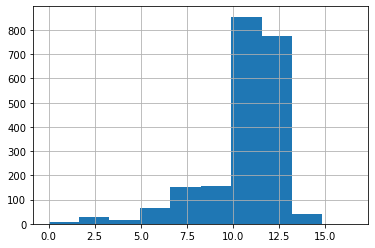

In [88]:
df.rating_numerator.hist()

Most of the ratings are between 10 and 13

In [89]:
#which dog breed had the highest number of ratings?
top_ten = df.groupby(["dog_breed"])["rating_numerator"].count().nlargest(10).reset_index()
top_ten_breed = top_ten["dog_breed"]
top_ten_breed

0      golden_retriever
1              pembroke
2    labrador_retriever
3             chihuahua
4                   pug
5            pomeranian
6                  chow
7              malamute
8            toy_poodle
9               samoyed
Name: dog_breed, dtype: object

Text(0, 0.5, 'Dog Rating')

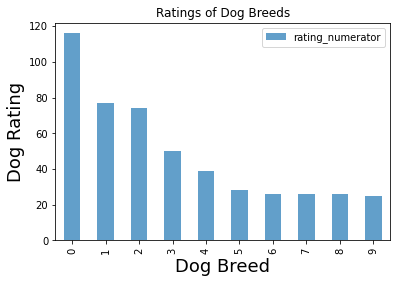

In [90]:
#visualizing 
top_ten.plot(kind="bar", title="Ratings of Dog Breeds",alpha=0.7);
plt.xlabel("Dog Breed",fontsize=18)
plt.ylabel("Dog Rating",fontsize=18)

In [110]:
#getting the picture of the top ten dog breeds with the highest number of rating
dog_list = ["golden_retriever","pembroke","labrador_retriever","chihuahua","pug","pomeranian","chow","malamute","toy_poodle",
            "samoyed"]
df[df["dog_breed"].isin(dog_list)][["jpg_url","rating_numerator","name"]]

,jpg_url,rating_numerator,name
1,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,13.0,Tilly
2,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,12.0,Archie
7,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,13.0,dog
9,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,14.0,Cassie
10,https://pbs.twimg.com/media/DFnwSY4WAAAMliS.jpg,13.0,Koda
...,...,...,...
2066,https://pbs.twimg.com/media/CT-D2ZHWIAA3gK1.jpg,9.0,dog
2069,https://pbs.twimg.com/media/CT9cx0tUEAAhNN_.jpg,8.0,dog
2070,https://pbs.twimg.com/media/CT9Vn7PWoAA_ZCM.jpg,10.0,dog
2080,https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg,6.0,dog


In [109]:
dog_list = ["golden_retriever","pembroke","labrador_retriever","chihuahua","pug","pomeranian","chow","malamute","toy_poodle",
            "samoyed"]
df[df["dog_breed"].isin(dog_list)]["jpg_url"]

1       https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg
2       https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg
7       https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg
9       https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg
10      https://pbs.twimg.com/media/DFnwSY4WAAAMliS.jpg
                             ...                       
2066    https://pbs.twimg.com/media/CT-D2ZHWIAA3gK1.jpg
2069    https://pbs.twimg.com/media/CT9cx0tUEAAhNN_.jpg
2070    https://pbs.twimg.com/media/CT9Vn7PWoAA_ZCM.jpg
2080    https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg
2083    https://pbs.twimg.com/media/CT5Vg_wXIAAXfnj.jpg
Name: jpg_url, Length: 487, dtype: object

In [92]:
#what is the highest rating?
df["rating_numerator"].max()

16.5

In [93]:
#did the most popular dog have the highest rating?
df[df["rating_numerator"]==16.5]["dog_breed"]

699    labrador_retriever
Name: dog_breed, dtype: object

2. Which dog stage is most popular or had the highest number of ratings?
In order to prevent None been listed as a dog stage type in the dog stage column, I will replace none to nan

In [94]:
df['dog_stage'].replace('None', np.nan, inplace=True)
df.dog_stage.sample(5)

1438    NaN
653     NaN
1116    NaN
301     NaN
2054    NaN
Name: dog_stage, dtype: object

In [95]:
#lets look at the dog stages of the top ten dog breeds with the highest number of ratings?
top_stage = df.groupby(["dog_breed","dog_stage"])["rating_numerator"].count().nlargest(10).reset_index()
top_stage

,dog_breed,dog_stage,rating_numerator
0,golden_retriever,"pupper,None",13
1,golden_retriever,doggo,8
2,pembroke,"pupper,None",8
3,labrador_retriever,"pupper,None",7
4,pug,"pupper,None",7
5,pomeranian,"pupper,None",6
6,labrador_retriever,doggo,4
7,lakeland_terrier,"pupper,None",4
8,border_collie,"pupper,None",3
9,eskimo_dog,"puppo,None",3


3. Do Dogs with higher ratings have more likes and retweets? To answer this question, I will use the cut function to segment and sort rating_numerator values into bins in a new column and visualize using matplotlib.

In [96]:
#bin_edges = [min, 25th percentile, median, 75th percentile, max] of rating_numerator
bin_edges = [0, 10, 11, 12, 16.5]
bin_names = ["Very_Low","Low","Moderately_High","High"]
df["rating_level"] = pd.cut(df["rating_numerator"],bin_edges,labels=bin_names)
df.head()

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,dog_stage,jpg_url,img_num,dog_breed,p_conf,retweet_count,favorite_count,rating_level
0,892420643555336193,2017-08-01 16:23:56+00:00,This is Phineas. He's a mystical boy. Only eve...,13.0,10,Phineas,NaN,NaN,NaN,NaN,NaN,7009.0,33810.0,High
1,892177421306343426,2017-08-01 00:17:27+00:00,This is Tilly. She's just checking pup on you....,13.0,10,Tilly,NaN,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,chihuahua,0.323581,5301.0,29330.0,High
2,891815181378084864,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncin...,12.0,10,Archie,NaN,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,chihuahua,0.716012,3481.0,22049.0,Moderately_High
3,891689557279858688,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal...,13.0,10,Darla,NaN,NaN,NaN,NaN,NaN,7225.0,36937.0,High
4,891327558926688256,2017-07-29 16:00:24+00:00,This is Franklin. He would like you to stop ca...,12.0,10,Franklin,NaN,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,7760.0,35311.0,Moderately_High


Text(0, 0.5, 'Retweet Count')

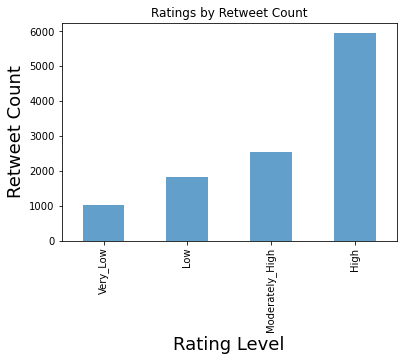

In [97]:
#lets see if retweet count influence rating
df.groupby("rating_level")["retweet_count"].mean().plot(kind="bar",title="Ratings by Retweet Count",alpha=.7);
plt.xlabel("Rating Level",fontsize=18)
plt.ylabel("Retweet Count",fontsize=18)

Text(0, 0.5, 'Favorite Count')

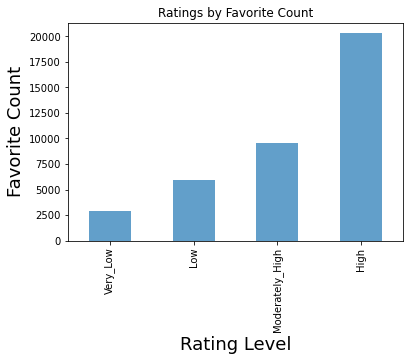

In [98]:
#favorite count and rating level
df.groupby("rating_level")["favorite_count"].mean().plot(kind="bar",title="Ratings by Favorite Count",alpha=.7);
plt.xlabel("Rating Level",fontsize=18)
plt.ylabel("Favorite Count",fontsize=18)

From the bar charts above, on average dogs with high ratings does have high number of retweets and likes (favorite count)

3. Is there any relationship between ratings, retweets and likes (favorite count)?

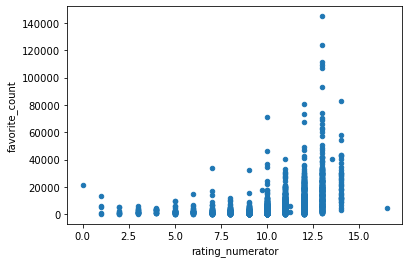

In [99]:
#correlation between ratings, favorite count and retweet count
df.plot(x="rating_numerator",y="favorite_count", kind="scatter")
plt.show()

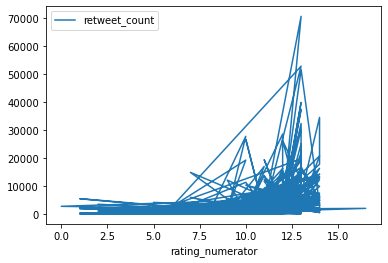

In [100]:
df.plot(x="rating_numerator",y="retweet_count", kind="line")
plt.show()

From the two graphs above, after a high rating of about 14, higher ratings do not have significantly more likes and retweets. Infact, ratings>14 seem to have similar likes and retweet counts with zero ratings.

4. Any relationship between favorite count (likes) and retweet count?

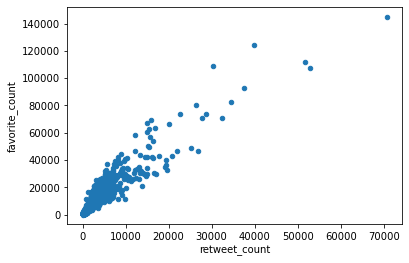

In [101]:
df.plot(x="retweet_count",y="favorite_count", kind="scatter")
plt.show()

In [102]:
print(df['favorite_count'].corr(df['retweet_count']))

0.9259135113109074


Since I cannot get a clear relationship between ratings, retweets and favorite counts, I will look at the period of retweets and favorite counts and see if time is an influencing factor on @WeRateDogs dog ratings

In [103]:
import datetime as dt
df.timestamp = pd.to_datetime(df.timestamp)
df["month"] = df["timestamp"].dt.month
df["year"] = df["timestamp"].dt.year
df.head()

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,dog_stage,jpg_url,img_num,dog_breed,p_conf,retweet_count,favorite_count,rating_level,month,year
0,892420643555336193,2017-08-01 16:23:56+00:00,This is Phineas. He's a mystical boy. Only eve...,13.0,10,Phineas,NaN,NaN,NaN,NaN,NaN,7009.0,33810.0,High,8,2017
1,892177421306343426,2017-08-01 00:17:27+00:00,This is Tilly. She's just checking pup on you....,13.0,10,Tilly,NaN,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,chihuahua,0.323581,5301.0,29330.0,High,8,2017
2,891815181378084864,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncin...,12.0,10,Archie,NaN,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,chihuahua,0.716012,3481.0,22049.0,Moderately_High,7,2017
3,891689557279858688,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal...,13.0,10,Darla,NaN,NaN,NaN,NaN,NaN,7225.0,36937.0,High,7,2017
4,891327558926688256,2017-07-29 16:00:24+00:00,This is Franklin. He would like you to stop ca...,12.0,10,Franklin,NaN,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,7760.0,35311.0,Moderately_High,7,2017


Now which month and year had the highest number of retweets and favorite count?

In [104]:
df.groupby(["month","year"])[["favorite_count","retweet_count"]].agg([max,'count',sum])

favorite_count                  retweet_count                
                      max count        sum           max count       sum
month year                                                              
1     2016        33840.0   183   656678.0       19725.0   183  246251.0
      2017       124114.0    69  1140997.0       39923.0    69  345235.0
2     2016        33091.0   121   433561.0       13111.0   121  153310.0
      2017        62518.0    67  1029340.0       15437.0    67  226285.0
3     2016        30334.0   132   523768.0       16666.0   132  187510.0
      2017        41243.0    50   866194.0       10403.0    50  193858.0
4     2016        17387.0    60   241975.0        7251.0    60   78816.0
      2017        41916.0    42   846243.0       16141.0    42  197997.0
5     2016        49400.0    59   324628.0       15542.0    59  108898.0
      2017       108906.0    43  1118183.0       30210.0    43  273104.0
6     2016       144883.0    90   807430.0       70732.0    90  320992.0
      2017        92867.0    47  1174152.0       37455.0    47  249599.0
7     2016        41230.0    94   608658.0       19203.0    94  216970.0
      2017        67172.0    51  1449526.0       16918.0    51  294890.0
8     2016        46318.0    60   517646.0       26766.0    60  171895.0
      2017        33810.0     2    63140.0        7009.0     2   12310.0
9     2016        28116.0    68   637336.0       14740.0    68  196012.0
10    2016        42779.0    72   854993.0       20782.0    72  271525.0
11    2015        42296.0   295   300919.0       14617.0   295  123785.0
      2016        46829.0    54   669109.0       21987.0    54  208861.0
12    2015        73530.0   371  1136340.0       28598.0   371  460618.0
      2016       111698.0    56   819144.0       51682.0    56  264468.0

@WeRateDogs twitter account had the highest number of dog postings on december 2015 with 371 people posting their dogs but saw the highest favorite_count and retweet_count activity on the August 2017 with 1,449.849 likes and on December 2015 with 460,727 retweets, but, the highest likes and retweets received for a dog posting was on June 2016 with 144,904 likes and 70,751 retweets. Lets look at the dog breeds and their ratings during these periods

In [105]:
df[(df["month"]==6)&(df["year"]==2016)]["rating_numerator"].max()

14.0

In [106]:
df[(df["month"]==12)&(df["year"]==2015)]["rating_numerator"].max()

13.0

In [107]:
df[(df["month"]==8)&(df["year"]==2017)]["rating_numerator"].max()

13.0

From the evaluations above, dog ratings aren't influenced by number of postings or how busy the @dogrates twitter account was.

## Observations
1. Golden Retrievers were most popular during the period of analyses with the most number of ratings
2. Labrador retrievers of the pupper stage were the most popular
3. The most popular dog breeds didnot have the highest number of likes and retweets
4. Ratings of 14/10 and below were most popular
5. There is a strong correlation between favorite count and retweets, although not enough to infer causality but dog breeds with high number of favorite count have fairly high number of retweets
6. Some dogs had zero likes, zero ratings but high number of retweets.
7. Ratings are not influenced by activity in the account or by time

## Conclusion
8. Dogs are rated based on pictures of dogs sent to @WeRateDogs by the creators of the account. It is neither influenced by the number of likes, retweets, time or how busy the account is during the time of analysis. In addition, postings of dogs in pairs are cumulatively rated i.e., if a picture of 5 puppers are posted in one time, they are rated together like 500/100 meaning 10/10 per pupper.

## LIMITATION(S)
1. Lots of missing values for the dog stage, couldnt determine the actual dog stage type that is most popular. I had to use the top ten dog breeds to determine that
2. Not all the dog breeds had a name or picture. 